# Introduction

## Electric Motor
The electric motor works on the principle of converting the electrical energy into mechanical energy by the application of a magnetic field on a current carrying conductor. The most basic equation of the force applied on a current carrying rod of length 'l' and with current 'i' and a magnetic field 'B' is

F = (i * l) * B * sin(theta)

This force will cause the rod to move in the resultant direction. So, in a basic DC motor the current carrying armature when placed in a magnetic field it will cause the armature to rotate because of the magnetic field.

The force mentioned above is directly proportional to the centripetal force of the armature which is given by

F = m * w^2 * r        -- w is the angular speed of the motor

So, the angular speed of the motor is directly proportional to the current carried by the wire.

## Synchronous motor
The name synchronous means that the motor will have an angular speed that is constant and is equal to the frequency of the alternating current that is supplied to the motor. The functioning of this motor utilizes both the AC and DC currents. As for any motor, this motor also has a stator and a rotor. Both of them will have some teeth like in a gear wheel but not sharp ones. The windings are set up around each tooth on both the stator and rotor.

The stator is supplied with the 3 phase alternating current and the rotor is given the direct current. The arrangement will be in such a way that there will the an attractive force between the teeth of the rotor and stator and this will cause the rotor to rotate.

## Permanent Magnet Synchronous motor
This is a synchronous motor that has permanent magnets on the rotor instead of a winding that is supplied with DC. Using a permanent magnet will make it easier to operate and also there will be no heat losses due to the resistance of the rotor winding.

In these motors there will be two components of current and voltage. The D component and the Q component. The D component is in the direction of the magnetic poles of the rotor and the Q component is perpendicular to it. The Q component is repsonsible for the torque generated.

## Understanding the data
The data collected from the motor contains many variables that includes the ambient and coolant temperatures, the voltages and currents of the D and Q components, the motor's speed and torque, the temperatures of the rotor's permanent magnet, the stator's yoke, teeth and windings.

The common reasons for heat generation that causes temperature increase in a basic motor are the heat from resistance of the windings as current passes through it and from the friction between the moving and static components if there is any contact between them. In a PMSM there is no contact between the stator and the rotor. The force is generated by magnetic fields, hence this is no mechanical friction. So, the other heat source will be the resistance heating. This is the heat that is transmitted to different parts of the stator and the rotor.

This heat does not affect the functioning of the motor as long as the heat does not melt the windings. So, theoretically the temperatures will not affect the speed and torque of the motor.

The other data which are the voltages and current will influence the speed and torque. With further data exploration we can find the relationship between different features.



# EDA

## Importing the libraries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_csv('temperature_data.csv')
data

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


#### Feature description

ambient - the temperature of the surroundings of the motor

coolant - the temperature of the coolant used in the motor

u_d - the D component of the voltage

u_q - the Q component of the voltage

motor_speed - the speed of the motor

torque - the torque generated in the motor

i_d - the D component of the current

i_q - the Q component of the current

pm - the temperature of the permanent magnet rotor

stator_yoke - the temperature of the stator's yoke which is the main body

stator_tooth - the temperature of the stator's tooth to which the winding is wound

stator_winding - the temperature of the stator's winding that carries the current



## Check for duplicates
Checking if there are any duplicate rows in the data

In [ ]:
data[data.duplicated()].shape

(0, 13)

The data does not have any duplicate rows as the row count is 0

## Check for missing values

In [ ]:
data.isna().value_counts()

ambient  coolant  u_d    u_q    motor_speed  torque  i_d    i_q    pm     stator_yoke  stator_tooth  stator_winding  profile_id
False    False    False  False  False        False   False  False  False  False        False         False           False         998070
dtype: int64

There are no missing values in any of the columns

## Check for any data type errors

In [ ]:
data.dtypes

ambient           float64
coolant           float64
u_d               float64
u_q               float64
motor_speed       float64
torque            float64
i_d               float64
i_q               float64
pm                float64
stator_yoke       float64
stator_tooth      float64
stator_winding    float64
profile_id          int64
dtype: object

No errors in the data types of the features. All are as they are supposed to be

## Dropping unnecessary columns
The profile_id is just an identifier of the observations. It is not needed for the analysis

In [ ]:
data1 = data.drop('profile_id', axis = 1)
data1

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


## Check for correlation between the columns
The correlation will tell us which columns are important in predicting the target variable and which are not

In [ ]:
data1.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
ambient,1.000000,0.434435,0.194754,0.087430,0.078283,-0.262264,0.005605,-0.260562,0.501496,0.451616,0.396742,0.301883
coolant,0.434435,1.000000,0.178708,0.027851,-0.033332,-0.189617,0.108489,-0.186060,0.430548,0.874037,0.689003,0.509298
u_d,0.194754,0.178708,1.000000,-0.027472,-0.233828,-0.821325,0.358517,-0.796586,-0.082564,0.041428,-0.066256,-0.150714
u_q,0.087430,0.027851,-0.027472,1.000000,0.716897,-0.037262,-0.181855,-0.026348,0.101236,0.106186,0.149017,0.125445
motor_speed,0.078283,-0.033332,-0.233828,0.716897,1.000000,0.024517,-0.722914,0.006323,0.332419,0.182564,0.333909,0.393154
torque,-0.262264,-0.189617,-0.821325,-0.037262,0.024517,1.000000,-0.239059,0.996560,-0.072905,-0.092207,-0.011055,0.080981
i_d,0.005605,0.108489,0.358517,-0.181855,-0.722914,-0.239059,1.000000,-0.204230,-0.299227,-0.179903,-0.387712,-0.539924
i_q,-0.260562,-0.186060,-0.796586,-0.026348,0.006323,0.996560,-0.204230,1.000000,-0.086486,-0.098753,-0.025191,0.060949
pm,0.501496,0.430548,-0.082564,0.101236,0.332419,-0.072905,-0.299227,-0.086486,1.000000,0.695014,0.768352,0.729561
stator_yoke,0.451616,0.874037,0.041428,0.106186,0.182564,-0.092207,-0.179903,-0.098753,0.695014,1.000000,0.949898,0.845144


From the correlation matrix it can be observed that the motor_speed is strongly and positively influenced by the u_q column, and strongly and negatively influenced by the i_d column.

The pm, stator_yoke, stator_teeth, and stator_winding temperature columns have some positive weak influence. But if we check for correlations between these 4 columns we can see that these temperatures are strongly correlated to one another. The reason is that the heat generated is travelling from the windings to all other parts.

Using these variables in the model training will cause **Multi-Collinearity** issues. So some regularization techniques should be used to find out which columns are really important to predict the motor_speed.

## Check for outliers
Now the outliers should be checked and dealt with. These outliers can influence the correlation as well. They can be noise, errors in the measurements and so on. The outliers can be detected using the box plots

<Axes: >

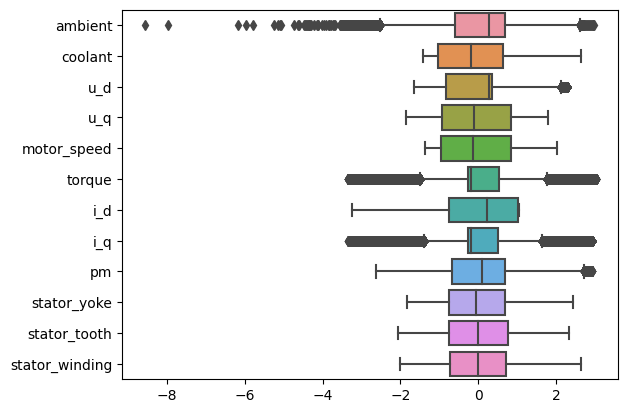

In [ ]:
sns.boxplot(data = data1, orient = 'h')

We can see that there are quite many outliers in the ambient, torque and the i_q columns. Let us see how many outliers are there in each column.

### Cleaning the ambient column

In [ ]:
data1['ambient'].describe()

count    998070.000000
mean         -0.003905
std           0.993127
min          -8.573954
25%          -0.599385
50%           0.266157
75%           0.686675
max           2.967117
Name: ambient, dtype: float64

The lower quartile of the ambient column is -0.599385 and upper quartile is 0.686675. We should calculate the lower whisker and the upper whisker and see how many points are not in between those two. Those points are the outliers.

If the outlier count is not that significant compared to the actual size of the data, those rows can be deleted.

In [ ]:
## Lower whisker
ambient_lw = -0.599385 - 1.5 * (0.686675 + 0.599385)
ambient_lw

-2.528475

In [ ]:
## Upper whisker
ambient_uw = 0.686675 + 1.5 * (0.686675 + 0.599385)
ambient_uw

2.615765

In [ ]:
## Count of the observations that are not in between the lower and upper whiskers
(data1[data1['ambient'] < -2.528475].shape)[0] + (data1[data1['ambient'] > 2.615765].shape)[0]

38492

In [ ]:
## Total obsevation count minus the outlier count
(data1.shape)[0] - 38492

959578

The change is not that significant and these observations containing the outliers can be dropped. The entire column can be deleted if this count is significant. It is not recommended to delete the column till the correlation of the column, without the outliers, is checked with the target variable.

In [ ]:
## Dropping the rows with outliers
data2 = data1[(data1['ambient'] > -2.528475) & (data1['ambient'] < 2.615765)]
data2

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


In [ ]:
## Checking for correlation again
data2.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
ambient,1.000000,0.390512,0.202741,0.052778,0.030211,-0.215072,0.002695,-0.214153,0.418746,0.417737,0.372006,0.297714
coolant,0.390512,1.000000,0.173827,0.011655,-0.055855,-0.165706,0.113556,-0.162032,0.397879,0.875772,0.690611,0.515746
u_d,0.202741,0.173827,1.000000,-0.029867,-0.230422,-0.841303,0.346582,-0.815101,-0.092215,0.040455,-0.064717,-0.146072
u_q,0.052778,0.011655,-0.029867,1.000000,0.717419,-0.014501,-0.196458,-0.003897,0.077500,0.095139,0.144363,0.128833
motor_speed,0.030211,-0.055855,-0.230422,0.717419,1.000000,0.045332,-0.739257,0.026881,0.309729,0.163271,0.322242,0.391863
torque,-0.215072,-0.165706,-0.841303,-0.014501,0.045332,1.000000,-0.211121,0.996450,-0.020649,-0.074537,-0.002312,0.071915
i_d,0.002695,0.113556,0.346582,-0.196458,-0.739257,-0.211121,1.000000,-0.177118,-0.314173,-0.173212,-0.381976,-0.531894
i_q,-0.214153,-0.162032,-0.815101,-0.003897,0.026881,0.996450,-0.177118,1.000000,-0.035090,-0.080682,-0.015909,0.052691
pm,0.418746,0.397879,-0.092215,0.077500,0.309729,-0.020649,-0.314173,-0.035090,1.000000,0.681908,0.770913,0.751267
stator_yoke,0.417737,0.875772,0.040455,0.095139,0.163271,-0.074537,-0.173212,-0.080682,0.681908,1.000000,0.949466,0.847970


The correlation with the ambient column is decreased from the previous value. And the correlations with the u_q and i_d columns have increase which is a good result.

### Cleaning the torque column

In [ ]:
data2['torque'].describe()

count    959578.000000
mean         -0.035645
std           0.978330
min          -3.345953
25%          -0.323357
50%          -0.246722
75%           0.506316
max           2.967752
Name: torque, dtype: float64

The lower quartile of the torque column is -0.323357 and upper quartile is 0.506316. We should calculate the lower whisker and the upper whisker and see how many points are not in between those two. Those points are the outliers.

If the outlier count is not that significant compared to the actual size of the data, those rows can be deleted.

In [ ]:
## Lower whisker
torque_lw = -0.323357 - 1.5 * (0.506316+0.323357)
torque_lw

-1.5678665

In [ ]:
## Upper whisker
torque_uw = 0.506316 + 1.5 * (0.506316+0.323357)
torque_uw

1.7508255

In [ ]:
## Count of the observations that are not in between the lower and upper whiskers
(data2[data2['torque'] < torque_lw].shape)[0] + (data2[data2['torque'] > torque_uw].shape)[0]

110664

In [ ]:
## Total obsevation count minus the outlier count
(data2.shape)[0] - 110664

848914

There is not that much loss of data when the outliers in the torque column are removed. So the rows with these outliers can be removed

In [ ]:
## Dropping the rows with outliers
data3 = data2[(data2['torque'] > torque_lw) & (data2['torque'] < torque_uw)]
data3

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


In [ ]:
## Checking for correlation again
data3.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
ambient,1.000000,0.393252,0.157655,0.067932,0.034693,-0.168279,0.012269,-0.169296,0.395841,0.411785,0.362378,0.290917
coolant,0.393252,1.000000,0.177800,0.014369,-0.059347,-0.166619,0.110797,-0.160983,0.380750,0.881103,0.699710,0.535284
u_d,0.157655,0.177800,1.000000,-0.008758,-0.287531,-0.875108,0.500493,-0.835466,-0.161174,-0.000509,-0.136719,-0.241029
u_q,0.067932,0.014369,-0.008758,1.000000,0.719397,-0.058176,-0.273484,-0.042775,0.086283,0.124536,0.190736,0.194286
motor_speed,0.034693,-0.059347,-0.287531,0.719397,1.000000,0.082019,-0.817050,0.049308,0.327390,0.188742,0.368485,0.463081
torque,-0.168279,-0.166619,-0.875108,-0.058176,0.082019,1.000000,-0.354015,0.993615,0.056916,-0.030137,0.070284,0.162123
i_d,0.012269,0.110797,0.500493,-0.273484,-0.817050,-0.354015,1.000000,-0.295971,-0.353316,-0.175101,-0.386156,-0.531290
i_q,-0.169296,-0.160983,-0.835466,-0.042775,0.049308,0.993615,-0.295971,1.000000,0.032153,-0.039802,0.048804,0.131823
pm,0.395841,0.380750,-0.161174,0.086283,0.327390,0.056916,-0.353316,0.032153,1.000000,0.675666,0.778520,0.780505
stator_yoke,0.411785,0.881103,-0.000509,0.124536,0.188742,-0.030137,-0.175101,-0.039802,0.675666,1.000000,0.949980,0.855471


The correlation of the motor_speed column with the u_q and i_d columns have further improved.

The correlation can also be checked using the pairplots

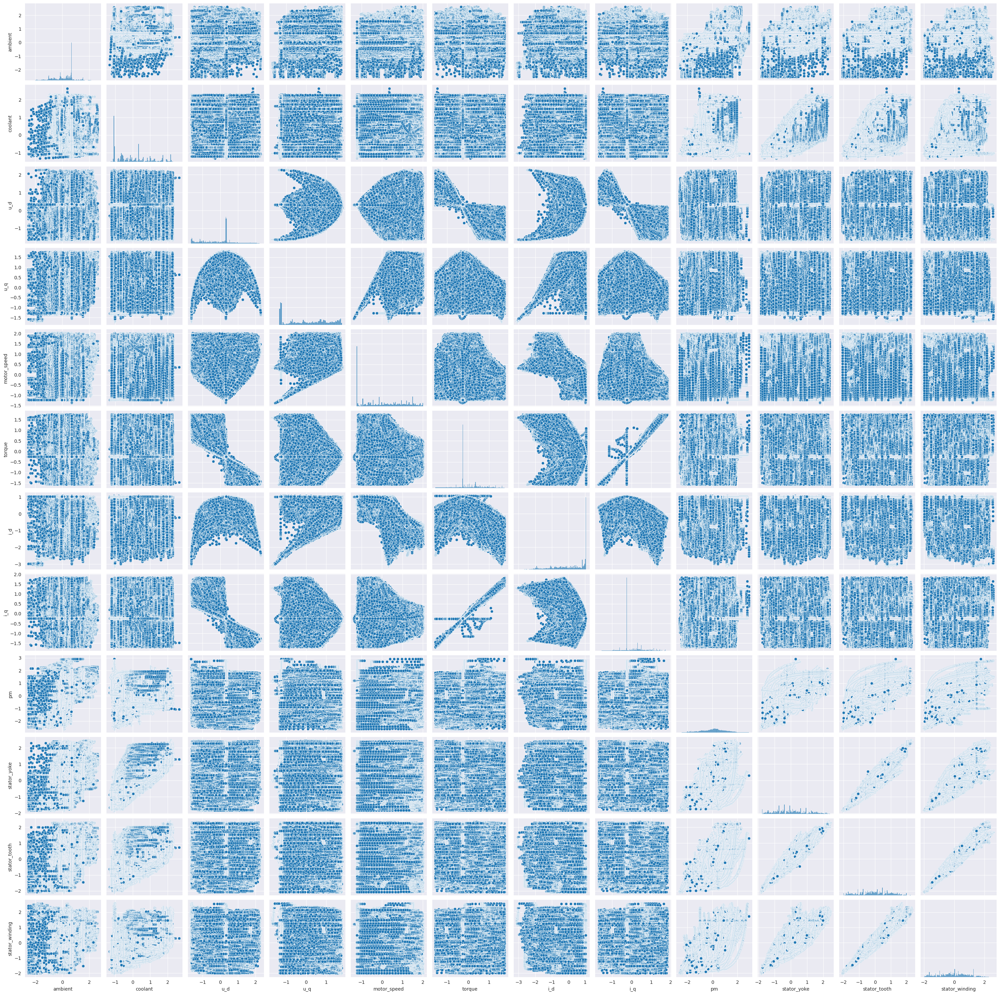

In [ ]:
sns.set_style(style='darkgrid')
sns.pairplot(data3)

In the pairplots too we can see motor_speed's strong correlation with u_q and i_d. Also we can see the strong correlations among the temperature columns at the bottom left. These correlations will cause multi-collinearity issues and disturbs the model training and predictions.

### Checking the box plots again for outliers
With most of the outliers removed it is better to check the current condition of the remaining columns with the outliers.

<Axes: >

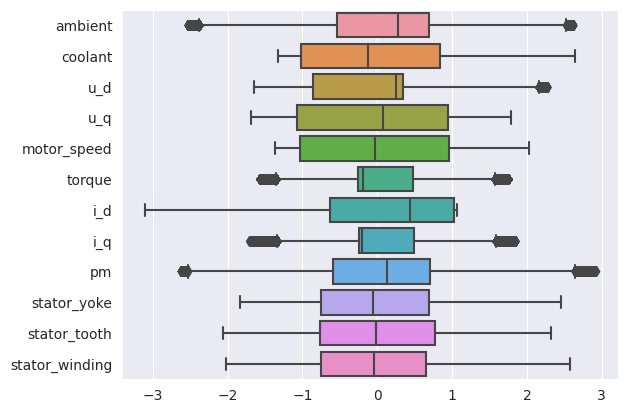

In [ ]:
sns.boxplot(data = data3, orient = 'h')

With these modifications we can see that the outliers have significantly reduced. We can stop here and proceed with further analysis of the data.

# Regularization
## To remove unwanted columns and solve multi-collinearity issue

We can remove the unwanted columns using two approaches. One is the regularization techniques and the next is using the VIF scores.

From the above analysis it is clear that the variables u_q and i_d are the only important variables in predicting the motor_speed. Let us check with these techniques as well

Let us check with the regularization first. There are 3 types of regularizations:
1. Ridge regularization - gives reasonable results but not always accurate
2. Lasso regularization - gives good results but sometimes misses the important data.
3. ElasticNet - a mix of the above two and gives the best results.

To perform the regularizations we need to do the data partition into independent and dependent variables and then into training and testing sets.

#### Partition into independent and dependent variables

In [ ]:
X = data3.drop('motor_speed', axis = 1)
y = data3['motor_speed']

#### Partition into training and testing sets

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

### Ridge Regularization

In [ ]:
# import ridge regression from sklearn library
from sklearn.linear_model import Ridge
import numpy as np
# Train the model
ridgeR = Ridge(alpha = 1)
ridgeR.fit(x_train, y_train)
y_pred = ridgeR.predict(x_test)

# calculate mean square error
mean_squared_error_ridge = np.mean((y_pred - y_test)**2)
print(mean_squared_error_ridge)

# get ridge coefficient and print them
ridge_coefficient = pd.DataFrame()
ridge_coefficient["Columns"]= x_train.columns
ridge_coefficient['Coefficient Estimate'] = pd.Series(ridgeR.coef_)
print(ridge_coefficient)

0.03118093328484125
           Columns  Coefficient Estimate
0          ambient             -0.025825
1          coolant              0.221013
2              u_d             -0.375896
3              u_q              0.474602
4           torque             -2.181269
5              i_d             -0.758626
6              i_q              1.533045
7               pm              0.072520
8      stator_yoke             -0.646206
9     stator_tooth              0.612903
10  stator_winding             -0.197371


The ridge coefficients of the unwanted columns should be reduced a lot and will be high for the important columns. The results here are contradicting with the initial observations. The results are not conclusive.

Trying with Lasso regularization

### Lasso Regularization

In [ ]:
from sklearn.linear_model import Lasso

# Train the model
lasso = Lasso(alpha = 1)
lasso.fit(x_train, y_train)
y_pred1 = lasso.predict(x_test)

# Calculate Mean Squared Error
mean_squared_error = np.mean((y_pred1 - y_test)**2)
print("Mean squared error on test set", mean_squared_error)
lasso_coeff = pd.DataFrame()
lasso_coeff["Columns"] = x_train.columns
lasso_coeff['Coefficient Estimate'] = pd.Series(lasso.coef_)

print(lasso_coeff)

Mean squared error on test set 1.0951757591947688
           Columns  Coefficient Estimate
0          ambient                   0.0
1          coolant                  -0.0
2              u_d                  -0.0
3              u_q                   0.0
4           torque                   0.0
5              i_d                  -0.0
6              i_q                   0.0
7               pm                   0.0
8      stator_yoke                   0.0
9     stator_tooth                   0.0
10  stator_winding                   0.0


The lasso coeffients for the unwanted variables will be reduced to zero and will be high for the needed ones. Here all are reduced to zero. So, the results are not conclusive here as well.

Trying with ElasticNet regularization

### ElasticNet Regularization

In [ ]:
# import model
from sklearn.linear_model import ElasticNet

# Train the model
e_net = ElasticNet(alpha = .4,l1_ratio=.5)
e_net.fit(x_train, y_train)

# calculate the prediction and mean square error
y_pred_elastic = e_net.predict(x_test)
mean_squared_error = np.mean((y_pred_elastic - y_test)**2)
print("Mean Squared Error on test set", mean_squared_error)

e_net_coeff = pd.DataFrame()
e_net_coeff["Columns"] = x_train.columns
e_net_coeff['Coefficient Estimate'] = pd.Series(e_net.coef_)
e_net_coeff

Mean Squared Error on test set 0.19552519064910534


,Columns,Coefficient Estimate
0,ambient,0.000000
1,coolant,-0.000000
2,u_d,-0.000000
3,u_q,0.352794
4,torque,-0.000000
5,i_d,-0.463179
6,i_q,-0.000000
7,pm,0.000000
8,stator_yoke,0.000000
9,stator_tooth,0.000000


As expected this gave the accurate results that matches with the initial observations. The elastic-net coefficients of the unwanted variables is reduced to 0 leaving the needed variables as u_q and i_d.

We can proceed to model building by just using these two variables.

Or we can also check with VIF scores of each variable to see if we can learn anything new.

### Checking with VIF scores
For VIF scores we need to check the residual scores by building models that checks for connections between one variable and the rest without including the target variable.

The statsmodels library is need for this.

In [ ]:
import statsmodels.formula.api as smf

data4 = data3[['u_d', 'u_q', 'motor_speed', 'torque','i_q', 'i_d', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding']]

## The residual scores for all the models with one independent variable as the predicted and the others as the predictors
rsq_ud = smf.ols('u_d~u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_ud = 1/(1-rsq_ud)

rsq_uq = smf.ols('u_q~u_d+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_uq = 1/(1-rsq_uq)

rsq_torque = smf.ols('torque~u_d+u_q+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_torque = 1/(1-rsq_torque)

rsq_id = smf.ols('i_d~u_d+u_q+torque+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_id = 1/(1-rsq_id)

rsq_iq = smf.ols('i_q~u_d+u_q+torque+i_d+pm+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_iq = 1/(1-rsq_iq)

rsq_pm = smf.ols('pm~u_d+u_q+torque+i_d+i_q+stator_yoke+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_pm = 1/(1-rsq_pm)

rsq_sy = smf.ols('stator_yoke~u_d+u_q+torque+i_d+i_q+pm+stator_tooth+stator_winding',data=data4).fit().rsquared
vif_sy = 1/(1-rsq_sy)

rsq_st = smf.ols('stator_tooth~u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_winding',data=data4).fit().rsquared
vif_st = 1/(1-rsq_st)

rsq_sw = smf.ols('stator_winding~u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth',data=data4).fit().rsquared
vif_sw = 1/(1-rsq_sw)

In [ ]:
## Making a data frame for the VIF scores
d1 = {'Variables':['u_d','u_q','torque','i_d','i_q','pm','stator_yoke','stator_tooth','stator_winding'],'VIF':[vif_ud,vif_uq,vif_torque,vif_id,vif_iq,vif_pm,vif_sy,vif_st,vif_sw]}
Vif_frame = pd.DataFrame(d1)
Vif_frame

,Variables,VIF
0,u_d,7.993156
1,u_q,1.691684
2,torque,236.098309
3,i_d,3.406393
4,i_q,185.394472
5,pm,3.633693
6,stator_yoke,101.437463
7,stator_tooth,520.928174
8,stator_winding,185.197762


The variable stator_tooth has the highest score followed by stator_winding and stator_yoke. These 3 variables are clearly not needed for analysis as their scores are comparitively very high from the other models.

Also the variables torque and i_q are having very scores as predicted above. So these two are also not needed.

The variable pm can be kept according to these scores. If the above mentioned 3 variables are removed the pm variable will not cause any errors individually and it has somewhat decent correlation with the motor_speed. So, we can proceed by keeping it.

The variable u_d have a bit higher score compared to others but it doesn't affect it much. So, it can be kept or removed. We can check this later during model training.

The final set of independent variables according to the VIF scores will be u_d, u_q, i_d, and pm.

In [ ]:
## Final datasets from both the regularization and vif score techniques
data_reg = data3[['u_q', 'i_d', 'motor_speed']]
data_vif = data3[['u_d', 'u_q', 'i_d', 'pm', 'motor_speed']]

In [ ]:
data_reg.to_csv('temperature_data_reg.csv')

In [ ]:
data_vif.to_csv('temperature_data_vif.csv')